# HW 3
In this homework assignment, **you are going to describe your final project research topic using open data and visualizations**. 

#### You must use in this notebook: 
- Census data and census geometries through the Census API.
- At least two maps that describe some aspect of the topic
- At least one chart in seaborn or matplotlib that describe some aspect of the topic.
- Optional: 
    - Socrata API
    - Google maps API
    - Other datasets that you might want to bring in. 

#### Grading
The grading breakdown for this assignment will be based on the following: 
- One paragraph description of the research topic (5 pts)
- One paragraph description of the datasets and methods you use to describe this topic (5 pts)
- Descriptive statistics and data summaries that are relevant for this topic, with the requirement that you use the Census through the API and, optionally, other data sources. (5 pts)
- Data cleaning and justifications, along with any additional analyses (buffers, spatial joins, group-by-summarize, etc) (15 pts)
- Two maps that show different aspects of your research topic (5 pts each)
- One chart that shows an aspect of your research topic (5 pts)

#### Due date
- Feb 28 (Wednesday) at 11:59pm. 

#### Deliverables
- This notebook and any related data files in zip file


<h4>Description of Research</h4>
Urban resources are not equally distributed. For example, tree coverage has been shown to be correlated with income, and lower-income areas also often have less transportation access. I want to explore the distribution of urban resources in relation to income and race in New York City. Specifically, I will investigate the access to subway, grocery stores, urban parks, and trees for each census tract. I plan to also create an equity score for each tract and relate it to median household income as well as non-white population percentage.

<h4>Datasets and Methods</h4>
I used the census API to query 2021 ACS survey data on median household income and demographics (total population, white population, and black population) by census tract. I also used the census tract geometry from the Census Bureau. From data.ny.gov I found a dataset on retail food stores in the entire state of NY, and from NYC Open Data I found information on parks and trees. The subway dataset I used is from the week 3 exercises of this course.

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context(context='paper')

%matplotlib inline

from census import Census
from us import states

c:\Users\desai\miniforge3\envs\crp4680\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
c = Census("172c2f047265e49507cff51bddf0f0d7f7350886") #my census key

In [3]:
#query data, category codes from: https://api.census.gov/data/2021/acs/acs5/variables.html
ny_census = c.acs5.state_county_tract(fields = ('NAME', 'B06011_001E','B01001_001E', 'B01001A_001E', 'B01001B_001E'),
                                      state_fips = states.NY.fips,
                                      county_fips = "*",
                                      tract = "*",
                                      year = 2021)

In [4]:
#create data frame, name columns, and create column for geoid
ny_df = pd.DataFrame(ny_census)
ny_df = ny_df.rename(columns={'B06011_001E':'median income', 
                      'B01001_001E':'population', 
                      'B01001A_001E':'population white', 
                      'B01001B_001E':'population black'})

ny_df["GEOID"] = ny_df["state"] + ny_df["county"] + ny_df["tract"]

#also create column for percentage non-white, and percentage black
#use np.where to guard against division by zero
ny_df['perc nonwhite'] = np.where(ny_df['population']==0, np.nan, 1 - ny_df['population white'] / ny_df['population'])
ny_df['perc black'] = np.where(ny_df['population']==0, np.nan, ny_df['population black'] / ny_df['population'])

In [5]:
#I'm only going to work with nyc data, so I filter the relevant counties by county FIP code
nyc_df = ny_df[ny_df['county'].isin(['005', '047', '061', '081', '085'])].reset_index()

In [53]:
#add shapefiles
ny_tract = gpd.read_file('https://www2.census.gov/geo/tiger/TIGER2021/TRACT/tl_2021_36_tract.zip')
nyc_census_geo = ny_tract[['NAMELSAD', 'GEOID', 'geometry']].merge(nyc_df, left_on = 'GEOID', right_on = 'GEOID')

#set crs with units in meters
nyc_census_geo = nyc_census_geo.to_crs(epsg=3857)

In [34]:
ny_tract.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC',
       'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry'],
      dtype='object')

In [54]:
# overview of census data
nyc_census_geo.describe()

# I also visualized the data, but this is slow, so I comment it out
# nyc_census_geo.explore()

,index,median income,population,population white,population black,perc nonwhite,perc black
count,2327.000000,2.327000e+03,2327.000000,2327.000000,2327.000000,2239.000000,2239.000000
mean,2366.779974,-2.832365e+07,3754.210142,1493.255264,877.765363,0.605573,0.244826
std,1313.218269,1.345883e+08,2089.412670,1496.333265,1145.861667,0.282787,0.283043
min,101.000000,-6.666667e+08,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1429.500000,2.609200e+04,2298.500000,375.000000,56.000000,0.358776,0.021060
50%,2011.000000,3.445000e+04,3520.000000,1074.000000,307.000000,0.656214,0.099688
75%,3671.500000,4.550950e+04,4919.000000,2118.000000,1437.000000,0.867782,0.423046
max,4301.000000,2.156250e+05,16629.000000,12129.000000,7006.000000,1.000000,1.000000


In [55]:
#I realized there is some tracts with income as -666666666
#these tracts cover mostly water, so I just replace them with nan values
nyc_census_geo['median income'] = nyc_census_geo['median income'].replace(-666666666, np.nan)

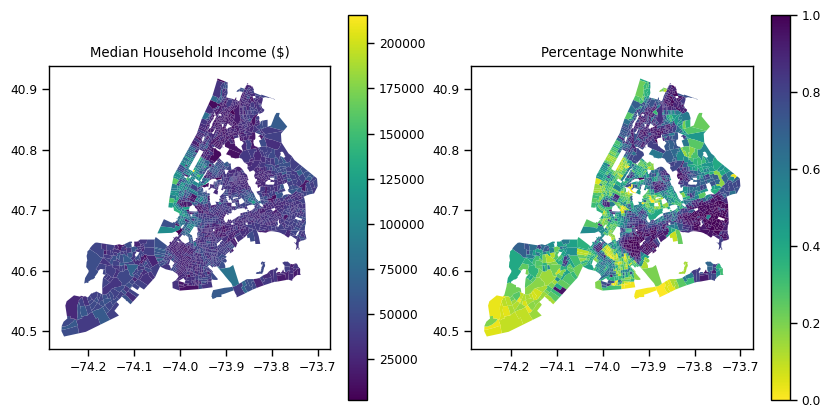

In [11]:
# Create a figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot 'median income' on the first subplot
nyc_census_geo.plot('median income', legend=True, ax=axes[0])

# Plot 'perc nonwhite' on the second subplot, reverse the color scale
nyc_census_geo.plot('perc nonwhite', legend=True, ax=axes[1], cmap='viridis_r')

axes[0].set_title('Median Household Income ($)')
axes[1].set_title('Percentage Nonwhite')

plt.show()

In [20]:
#load tree data, this takes ~5mins since there are 680,000+ trees
trees = gpd.read_file('2015 Street Tree Census - Tree Data.geojson')
trees = trees.to_crs(epsg=3857)

In [24]:
trees.describe()

,nta,health,zipcode,latitude,nta_name,state,trnk_wire,y_sp,brnch_othe,root_grate,...,address,sidewalk,root_other,created_at,borocode,block_id,trnk_light,tree_dbh,root_stone,geometry
count,683788,652172,683788,683788,683788,683788,683788,683788,683788,683788,...,683788,652172,683788,683788,683788,683788,683788,683788,683788,683788
unique,188,3,191,676080,188,1,2,682632,2,2,...,408701,2,2,483,5,101390,2,146,2,683352
top,SI01,Good,10312,40.66035938,Annadale-Huguenot-Prince's Bay-Eltingville,New York,No,179953.550904,No,No,...,106 CROSS BAY BOULEVARD,NoDamage,No,10/27/2015,4,204850,No,4,No,POINT (-73.76103529161729 40.660359381539436)
freq,12969,528850,22186,35,12969,683788,670514,35,659433,680252,...,262,464978,653466,6852,250551,450,682757,60372,543789,35


In [103]:
# count number of trees in each census tract
joined = gpd.sjoin(trees[["latitude", "longitude", "boro_ct", "tree_id", "geometry"]], nyc_census_geo, how='left', op="within")

trees_per_tract = joined.groupby('GEOID').size()
trees_per_tract_df = pd.DataFrame({"GEOID":trees_per_tract.index, "num trees":trees_per_tract.values})


c:\Users\desai\miniforge3\envs\crp4680\lib\site-packages\IPython\core\interactiveshell.py:3490: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [172]:
#add this data to a main dataframe with all relevant
gdf = nyc_census_geo.merge(trees_per_tract_df, on="GEOID", how='left') 

#I also add an area property
gdf['area']=gdf.area

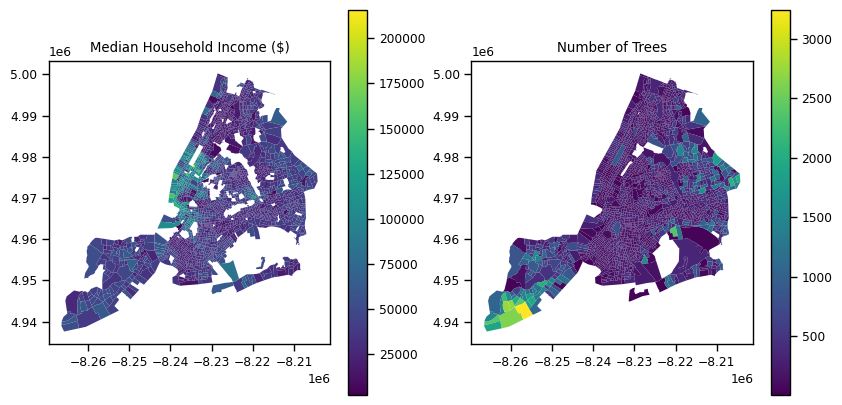

In [136]:
# Create a figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot 'median income' on the first subplot
gdf.plot('median income', legend=True, ax=axes[0])

# Plot 'perc nonwhite' on the second subplot, reverse the color scale
gdf.plot('num trees', legend=True, ax=axes[1])

axes[0].set_title('Median Household Income ($)')
axes[1].set_title('Number of Trees')

plt.show()

In [173]:
parks = gpd.read_file('Parks Properties_20240228.geojson')

#in order to calculate distances in meters I convert to epsg=3857
parks = parks.to_crs(epsg=3857)

#upon inspection I realized there are long strips of spaces that are between streets that are not necessarily parks, which shouldn't be counted
#I manually filter these out
parks = parks[~parks['signname'].isin(['Broadway Malls', 'Park Avenue Malls', 'Mall Thirty Four XXXIV'])]

#from in-class assignment I know that buffer geometry is around 800m
buffer_parks = parks['geometry'].buffer(800)

buffer_crs = parks.crs 
buffer_data_parks = parks[['location', 'signname', 'acres']]  

parks_buffer = gpd.GeoDataFrame(buffer_data_parks, 
                                         crs=buffer_crs, 
                                         geometry=buffer_parks)

c:\Users\desai\miniforge3\envs\crp4680\lib\site-packages\geopandas\io\file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


In [161]:
#parks_buffer.explore()

In [174]:
#I first join the buffer geometry using dissolve to find all the area covered
total_area_covered_parks = parks_buffer.dissolve()

#then I use overlay difference to find the tracts that are not covered by parks
uncovered_blocks_parks = gdf.overlay(total_area_covered_parks, how="difference")

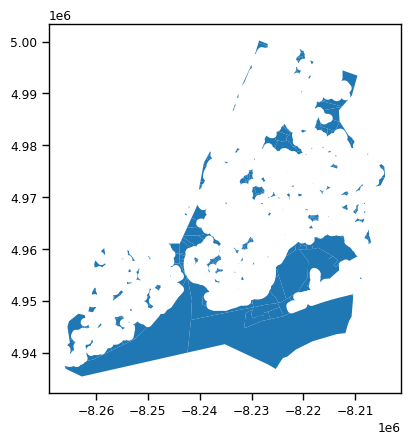

In [177]:
#quickly visualize this
uncovered_blocks_parks.plot()

uncovered_blocks_parks["uncovered_area_parks"] = uncovered_blocks_parks.area
uncovered_blocks_parks["uncovered_proportions_parks"] = uncovered_blocks_parks.area / uncovered_blocks_parks["area"]

In [179]:
#add information on park coverage to main dataframe
gdf = gdf.merge(uncovered_blocks_parks[["GEOID", "uncovered_proportions_parks"]], on="GEOID", how='left') 
gdf["uncovered_proportions_parks"] = gdf["uncovered_proportions_parks"].replace(np.nan, 0)

In [182]:
#repeat for food retail
food_retail = gpd.read_file('Retail Food Stores_NYC.geojson')
food_retail = food_retail.to_crs(epsg=3857)

buffer_food_retail = food_retail['geometry'].buffer(800)
 
food_retail_buffer = gpd.GeoDataFrame(food_retail, 
                                         crs=buffer_crs, 
                                         geometry=buffer_food_retail )

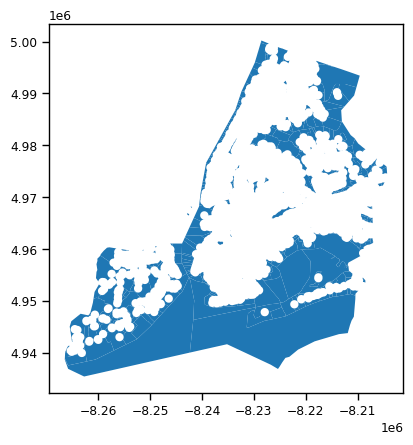

In [183]:
#dissolve buffer geometry and calculate how much area does not have access to grocery stores
total_area_covered_food_retail = food_retail_buffer.dissolve()

#then I use overlay difference to find the tracts that are not covered by parks
uncovered_tracts_food_retail = gdf.overlay(total_area_covered_food_retail, how="difference")

#quickly visualize this
uncovered_tracts_food_retail.plot()

uncovered_tracts_food_retail["uncovered_area_food_retail"] = uncovered_tracts_food_retail.area
uncovered_tracts_food_retail["uncovered_proportions_food_retail"] = uncovered_tracts_food_retail.area / uncovered_tracts_food_retail["area"]

In [185]:
#add information on food retail coverage to main dataframe
gdf = gdf.merge(uncovered_tracts_food_retail[["GEOID", "uncovered_proportions_food_retail"]], on="GEOID", how='left') 
gdf["uncovered_proportions_food_retail"] = gdf["uncovered_proportions_food_retail"].replace(np.nan, 0)

In [186]:
#lastly, repeat buffer creation for subway
subway = gpd.read_file('Subway Stations.zip')
subway = subway.to_crs(epsg=3857)

buffer_subway = subway['geometry'].buffer(800)
 
subway_buffer = gpd.GeoDataFrame(subway, 
                                         crs=buffer_crs, 
                                         geometry=buffer_subway)

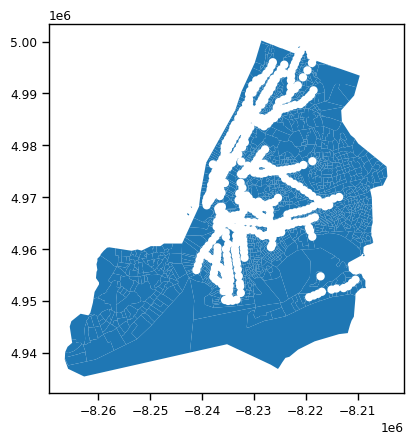

In [187]:
#dissolve buffer geometry and calculate how much area does not have access to grocery stores
total_area_covered_subway = subway_buffer.dissolve()

#then I use overlay difference to find the tracts that are not covered by parks
uncovered_tracts_subway = gdf.overlay(total_area_covered_subway, how="difference")

#quickly visualize this
uncovered_tracts_subway.plot()

uncovered_tracts_subway["uncovered_area_subway"] = uncovered_tracts_subway.area
uncovered_tracts_subway["uncovered_proportions_subway"] = uncovered_tracts_subway.area / uncovered_tracts_subway["area"]

In [188]:
#add information on food retail coverage to main dataframe
gdf = gdf.merge(uncovered_tracts_subway[["GEOID", "uncovered_proportions_subway"]], on="GEOID", how='left') 
gdf["uncovered_proportions_subway"] = gdf["uncovered_proportions_subway"].replace(np.nan, 0)

In [192]:
#summarize the indices related to trees, parks, food retail and subway access
gdf[['num trees', 'uncovered_proportions_parks', 'uncovered_proportions_food_retail', 'uncovered_proportions_subway']].describe()

,num trees,uncovered_proportions_parks,uncovered_proportions_food_retail,uncovered_proportions_subway
count,2306.000000,2327.000000,2327.000000,2327.000000
mean,296.468777,0.044658,0.058737,0.469204
std,284.933862,0.148856,0.175633,0.449251
min,2.000000,0.000000,0.000000,0.000000
25%,156.000000,0.000000,0.000000,0.000000
50%,226.000000,0.000000,0.000000,0.367390
75%,328.750000,0.000000,0.000000,1.000000
max,3245.000000,1.000000,1.000000,1.000000


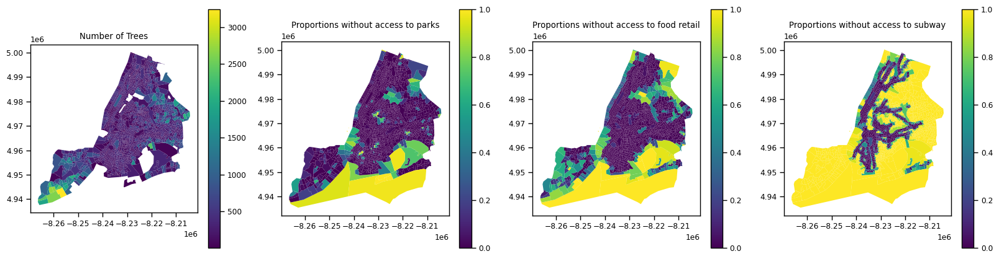

In [204]:

# Create a figure and subplots
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# visualize the four categories
gdf.plot('num trees', legend=True, ax=axes[0])
gdf.plot('uncovered_proportions_parks', legend=True, ax=axes[1])
gdf.plot('uncovered_proportions_food_retail', legend=True, ax=axes[2])
gdf.plot('uncovered_proportions_subway', legend=True, ax=axes[3])

axes[0].set_title('Number of Trees')
axes[1].set_title('Proportions without access to parks')
axes[2].set_title('Proportions without access to food retail')
axes[3].set_title('Proportions without access to subway')

plt.show()

In [200]:
# I wanted to combine all four indices to one score
# given that they are in different ranges, I normalize all values such that mean is 0.5, with standard deviation 1

# I created a normalization function and pass all four criteria through it
def normalize_column(column):
    min_val = column.min()
    max_val = column.max()
    normalized_column = (column - column.mean()) / column.std() +0.5
    return normalized_column

num_trees_norm = normalize_column(gdf["num trees"])
uncovered_proportions_parks_norm = normalize_column(gdf["uncovered_proportions_parks"])
uncovered_proportions_food_retail_norm = normalize_column(gdf["uncovered_proportions_food_retail"])
uncovered_proportions_subway_norm = normalize_column(gdf["uncovered_proportions_subway"])

In [201]:
# I examine what the distributions are
pd.concat([num_trees_norm,
uncovered_proportions_parks_norm,
uncovered_proportions_food_retail_norm,
uncovered_proportions_subway_norm], axis=1).describe()

,num trees,uncovered_proportions_parks,uncovered_proportions_food_retail,uncovered_proportions_subway
count,2306.000000,2327.000000,2327.000000,2327.000000
mean,0.500000,0.500000,0.500000,0.500000
std,1.000000,1.000000,1.000000,1.000000
min,-0.533464,0.199994,0.165571,-0.544415
25%,0.007013,0.199994,0.165571,-0.544415
50%,0.252684,0.199994,0.165571,0.273368
75%,0.613294,0.199994,0.165571,1.681512
max,10.848125,6.917893,5.859250,1.681512


In [215]:
#create the equity index, the lower this is, the more inequitable a tract is
gdf['access equity index'] = num_trees_norm - uncovered_proportions_parks_norm - uncovered_proportions_food_retail_norm -uncovered_proportions_subway_norm

<Axes: >

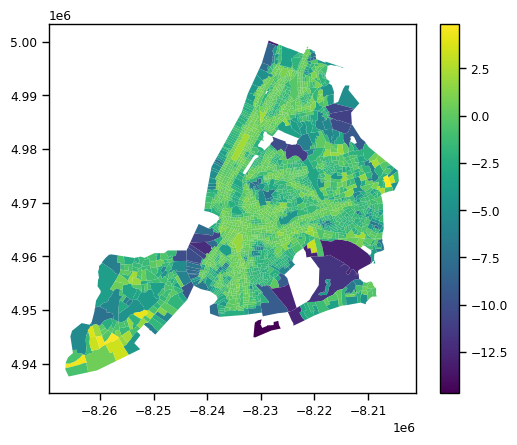

In [218]:
gdf.plot("access equity index", legend=True)

Text(0.5, 1.0, 'Trees v. Equity Index')

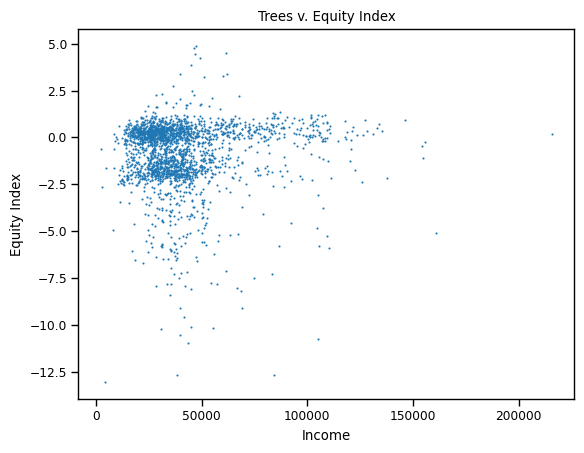

In [220]:
plt.scatter(gdf['median income'], gdf['access equity index'], s=0.5)
plt.xlabel('Income')
plt.ylabel('Equity Index')
plt.title('Trees v. Equity Index')

Text(0.5, 1.0, 'Percentage of Black Population v. Equity Index')

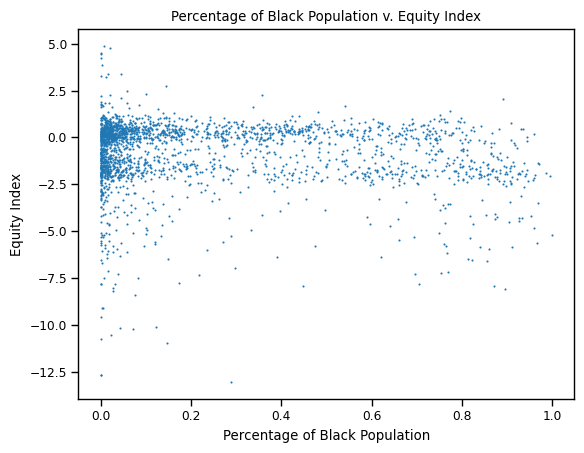

In [222]:
plt.scatter(gdf['perc black'], gdf['access equity index'], s=0.5)
plt.xlabel('Percentage of Black Population')
plt.ylabel('Equity Index')
plt.title('Percentage of Black Population v. Equity Index')

Text(0.5, 1.0, 'Percentage of Non-White Population v. Equity Index')

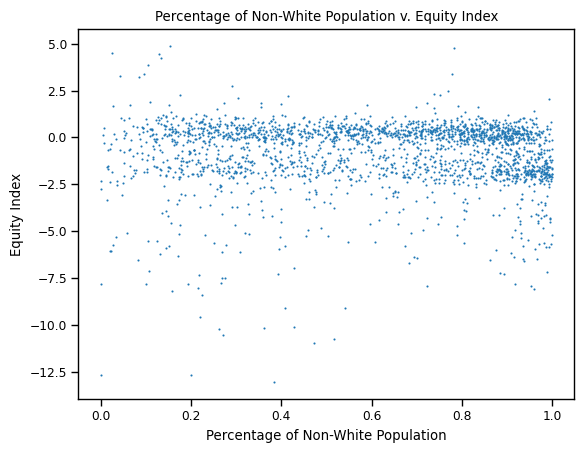

In [224]:
plt.scatter(gdf['perc nonwhite'], gdf['access equity index'], s=0.5)
plt.xlabel('Percentage of Non-White Population')
plt.ylabel('Equity Index')
plt.title('Percentage of Non-White Population v. Equity Index')

<h4>Discussion and Improvements</h4>
There seems not to be a very clear relationship between the variables I analyzed.

An issue I encountered is that the census tracts include a lot of bodies of water, which is not relevant to my analysis. However, they are counted in the area of each census tract, which leads to inaccurate results. For my final research, I want to trim the boundaries so that they only include land.

Further, I think I need to better define access to parks and food retail. Some parks are much bigger than others, and having access to them arguably is also better than to a small one, so I should somehow account for this. Food retail dataset currently also includes all stores that sell food, but a deli is very different from a big grocery store, and I aim to also account for this in future developments of this project.